In [6]:
# !pip install pandas
# !pip install scikit-learn
# !pip install missingno
# !pip install Jinja2
# !pip uninstall nbformat ipython plotly
# !pip install nbformat ipython plotly
# !pip install plotly
# !pip install nbformat --upgrade
# !pip install geopandas
# !pip install shapely

  Using cached missingno-0.5.2-py3-none-any.whl (8.7 kB)
  Obtaining dependency information for matplotlib from https://files.pythonhosted.org/packages/40/d9/c1784db9db0d484c8e5deeafbaac0d6ed66e165c6eb4a74fb43a5fa947d9/matplotlib-3.8.0-cp311-cp311-win_amd64.whl.metadata
  Using cached seaborn-0.12.2-py3-none-any.whl (293 kB)
  Obtaining dependency information for contourpy>=1.0.1 from https://files.pythonhosted.org/packages/16/09/989b982322439faa4bafffcd669e6f942b38fee897c2664c987bcd091dec/contourpy-1.1.0-cp311-cp311-win_amd64.whl.metadata
  Using cached contourpy-1.1.0-cp311-cp311-win_amd64.whl.metadata (5.7 kB)
  Using cached cycler-0.11.0-py3-none-any.whl (6.4 kB)
  Obtaining dependency information for fonttools>=4.22.0 from https://files.pythonhosted.org/packages/95/b6/9a5133deb5838c4dbe3ea27e8dba123622aa5112d43a079e9587636b4faf/fonttools-4.42.1-cp311-cp311-win_amd64.whl.metadata
  Using cached fonttools-4.42.1-cp311-cp311-win_amd64.whl.metadata (154 kB)
  Obtaining dependency info

In [35]:
### import libraries
import pandas as pd 
import numpy as np
import sklearn
from sklearn.model_selection import train_test_split
import missingno
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import datetime
from datetime import timedelta
from sklearn.cluster import DBSCAN

In [8]:
# Data extraction
data = pd.read_csv('D:/Kaggle Datasets/playground-series-s3e20/train.csv')
# top 5 rows
data[:5]

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
0,ID_-0.510_29.290_2019_00,-0.51,29.29,2019,0,-0.000108,0.603019,-0.000065,0.255668,-98.593887,...,3664.436218,61085.809570,2615.120483,15.568533,0.272292,-12.628986,35.632416,-138.786423,30.752140,3.750994
1,ID_-0.510_29.290_2019_01,-0.51,29.29,2019,1,0.000021,0.728214,0.000014,0.130988,16.592861,...,3651.190311,66969.478735,3174.572424,8.690601,0.256830,30.359375,39.557633,-145.183930,27.251779,4.025176
2,ID_-0.510_29.290_2019_02,-0.51,29.29,2019,2,0.000514,0.748199,0.000385,0.110018,72.795837,...,4216.986492,60068.894448,3516.282669,21.103410,0.251101,15.377883,30.401823,-142.519545,26.193296,4.231381
3,ID_-0.510_29.290_2019_03,-0.51,29.29,2019,3,NaN,NaN,NaN,NaN,NaN,...,5228.507736,51064.547339,4180.973322,15.386899,0.262043,-11.293399,24.380357,-132.665828,28.829155,4.305286
4,ID_-0.510_29.290_2019_04,-0.51,29.29,2019,4,-0.000079,0.676296,-0.000048,0.121164,4.121269,...,3980.598120,63751.125781,3355.710107,8.114694,0.235847,38.532263,37.392979,-141.509805,22.204612,4.347317


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79023 entries, 0 to 79022
Data columns (total 76 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   ID_LAT_LON_YEAR_WEEK                                      79023 non-null  object 
 1   latitude                                                  79023 non-null  float64
 2   longitude                                                 79023 non-null  float64
 3   year                                                      79023 non-null  int64  
 4   week_no                                                   79023 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  64414 non-null  float64
 6   SulphurDioxide_SO2_column_number_density_amf              64414 non-null  float64
 7   SulphurDioxide_SO2_slant_column_number_density            64414 non-null  float64
 8   SulphurDioxide_c

In [10]:
data.describe().T.style

,count,mean,std,min,25%,50%,75%,max
latitude,79023.000000,-1.891072,0.694522,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,79023.000000,29.880155,0.810375,28.228000,29.262000,29.883000,30.471000,31.532000
year,79023.000000,2020.000000,0.816502,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
week_no,79023.000000,26.000000,15.297155,0.000000,13.000000,26.000000,39.000000,52.000000
SulphurDioxide_SO2_column_number_density,64414.000000,0.000048,0.000272,-0.000996,-0.000096,0.000024,0.000153,0.004191
SulphurDioxide_SO2_column_number_density_amf,64414.000000,0.834848,0.185382,0.241822,0.705817,0.809118,0.942792,1.885239
SulphurDioxide_SO2_slant_column_number_density,64414.000000,0.000035,0.000206,-0.000887,-0.000078,0.000019,0.000121,0.004236
SulphurDioxide_cloud_fraction,64414.000000,0.158418,0.071364,0.000000,0.110535,0.161855,0.211824,0.299998
SulphurDioxide_sensor_azimuth_angle,64414.000000,-7.925870,64.263368,-179.537059,-56.782383,-12.441726,72.059990,122.095200
SulphurDioxide_sensor_zenith_angle,64414.000000,37.436189,14.149950,0.099237,28.844520,37.784299,47.634875,66.242012


In [11]:
# data split
## Train-Valid
### Train-Test

trainData, validData = train_test_split(data,test_size=0.2,random_state=42)
trainData, testData = train_test_split(trainData,test_size=0.1,random_state=42)

print(f'Train Dataset:', trainData.shape)
print(f'Valid Dataset:',validData.shape)
print(f'Test Dataset:', testData.shape)

Train Dataset: (56896, 76)
Valid Dataset: (15805, 76)
Test Dataset: (6322, 76)


<Axes: >

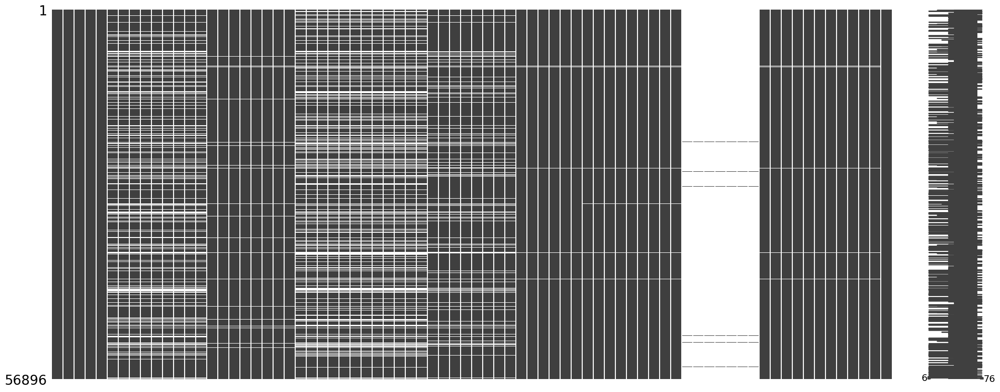

In [12]:
missingno.matrix(trainData)

In [17]:
def missingPer(data,columnName,idColumn):
    df = data.copy()
    return round(1-(df[columnName].count()/df[idColumn].count()),3)*100

In [18]:
# print null percentage from each column taking Id column as denominator
missingPerInfo = {}
for i in trainData.columns[1:]:
    missingPerInfo[i] = missingPer(trainData,i,'ID_LAT_LON_YEAR_WEEK')
print(sorted(missingPerInfo.items(),key=lambda x:x[1],reverse=True))

[('UvAerosolLayerHeight_aerosol_height', 99.5), ('UvAerosolLayerHeight_aerosol_pressure', 99.5), ('UvAerosolLayerHeight_aerosol_optical_depth', 99.5), ('UvAerosolLayerHeight_sensor_zenith_angle', 99.5), ('UvAerosolLayerHeight_sensor_azimuth_angle', 99.5), ('UvAerosolLayerHeight_solar_azimuth_angle', 99.5), ('UvAerosolLayerHeight_solar_zenith_angle', 99.5), ('NitrogenDioxide_NO2_column_number_density', 23.3), ('NitrogenDioxide_tropospheric_NO2_column_number_density', 23.3), ('NitrogenDioxide_stratospheric_NO2_column_number_density', 23.3), ('NitrogenDioxide_NO2_slant_column_number_density', 23.3), ('NitrogenDioxide_tropopause_pressure', 23.3), ('NitrogenDioxide_absorbing_aerosol_index', 23.3), ('NitrogenDioxide_cloud_fraction', 23.3), ('NitrogenDioxide_sensor_altitude', 23.3), ('NitrogenDioxide_sensor_azimuth_angle', 23.3), ('NitrogenDioxide_sensor_zenith_angle', 23.3), ('NitrogenDioxide_solar_azimuth_angle', 23.3), ('NitrogenDioxide_solar_zenith_angle', 23.3), ('SulphurDioxide_SO2_colu

In [19]:
# trainTarget = trainData['emission']
trainData.drop(columns = {'UvAerosolLayerHeight_aerosol_height','UvAerosolLayerHeight_aerosol_pressure',
                          'UvAerosolLayerHeight_aerosol_optical_depth','UvAerosolLayerHeight_sensor_zenith_angle',
                          'UvAerosolLayerHeight_sensor_azimuth_angle','UvAerosolLayerHeight_solar_azimuth_angle',
                          'UvAerosolLayerHeight_solar_zenith_angle'},inplace=True, axis=1)

In [20]:
num_col = list(trainData.iloc[:,1:].columns)

In [21]:
def find_outliers(col):
    try:
        # finding IQRs
        q1 = trainData[col].quantile(0.25)
        q3 = trainData[col].quantile(0.75)
        iqr = q3-q1 

        # finding upper and lower limit
        upper_limit = q3 + (1.5*iqr)
        lower_limit = q1 - (1.5*iqr)

        # finding outliers & trimming
        new_df =  trainData[(trainData[col] < upper_limit)&(trainData[col] > lower_limit)]
        
        # comparing plots after trimming
        plt.figure(figsize=(16,8))
        plt.suptitle(num_col.index(col))
        plt.subplot(2,2,1)
        sns.distplot(trainData[col])
        plt.subplot(2,2,2)
        sns.boxplot(trainData[col])
        plt.subplot(2,2,3)
        sns.distplot(new_df[col])
        plt.subplot(2,2,4)
        sns.boxplot(new_df[col])
    except:
        print("Column name",col)

C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_NO2_column_number_density


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_tropospheric_NO2_column_number_density


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_stratospheric_NO2_column_number_density


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_NO2_slant_column_number_density


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_tropopause_pressure


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_absorbing_aerosol_index


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_cloud_fraction


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_sensor_altitude


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_sensor_azimuth_angle


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_sensor_zenith_angle


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_solar_azimuth_angle


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

Column name NitrogenDioxide_solar_zenith_angle


C:\Users\Varun\AppData\Local\Temp\ipykernel_13396\3227035262.py:19: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(trainData[col])
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

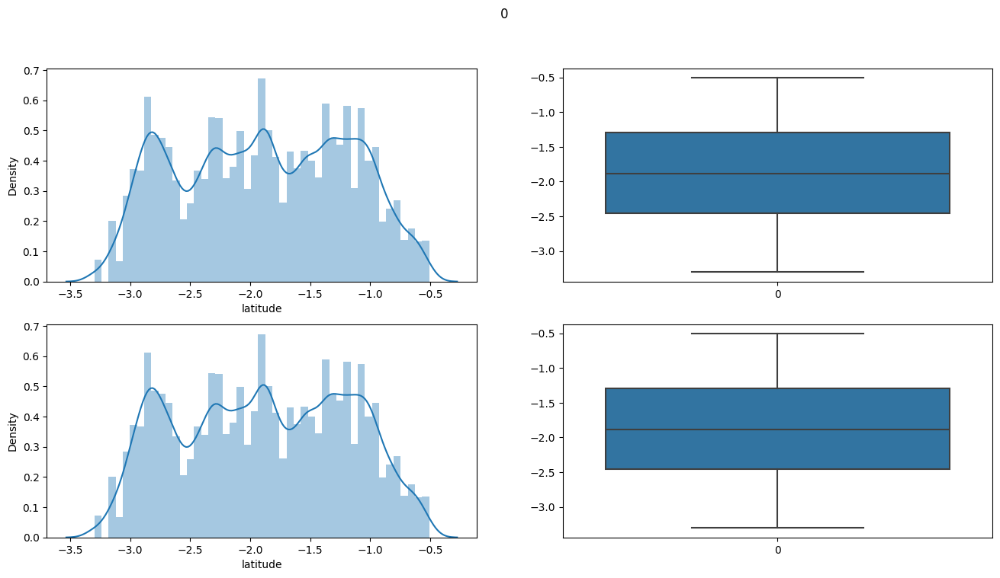

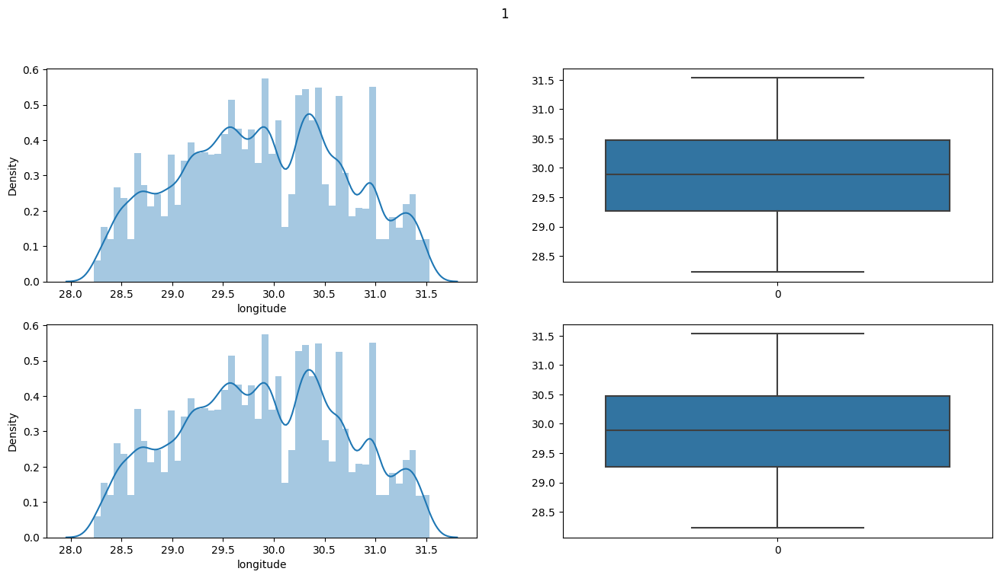

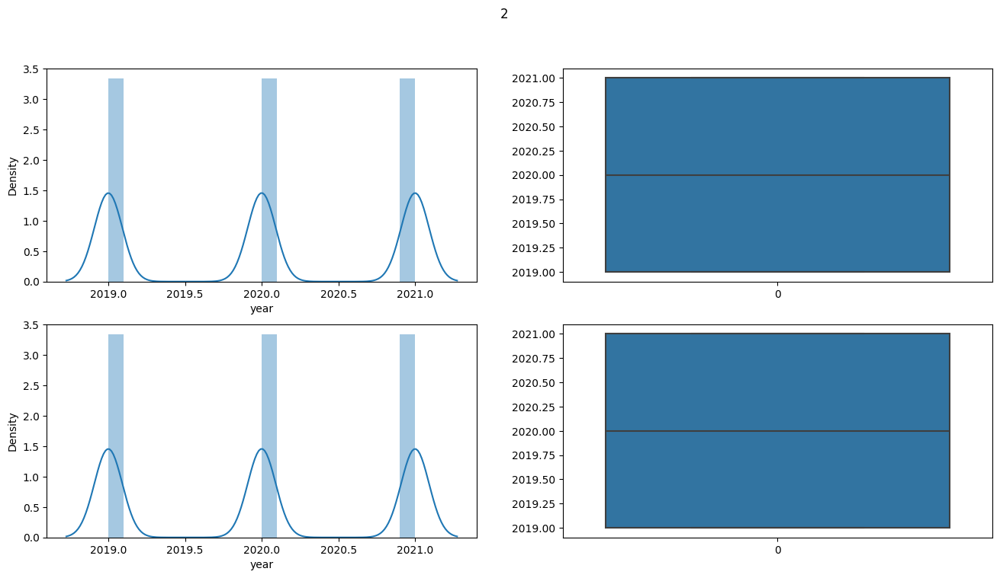

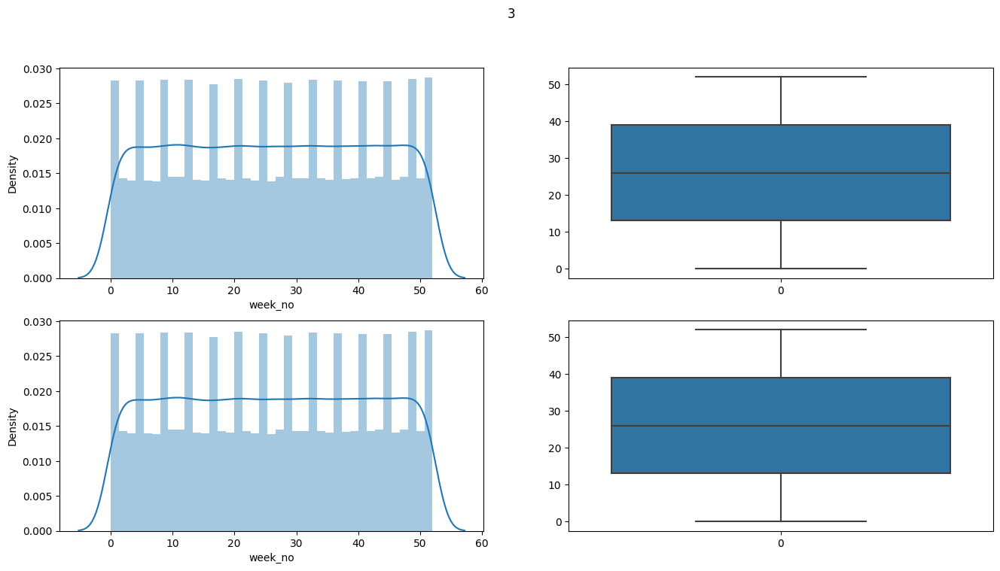

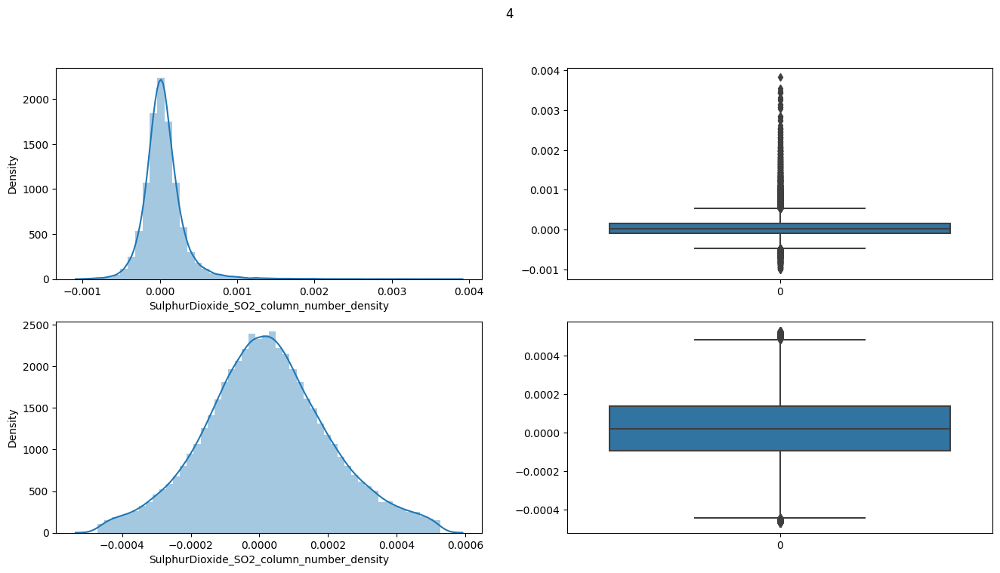

...

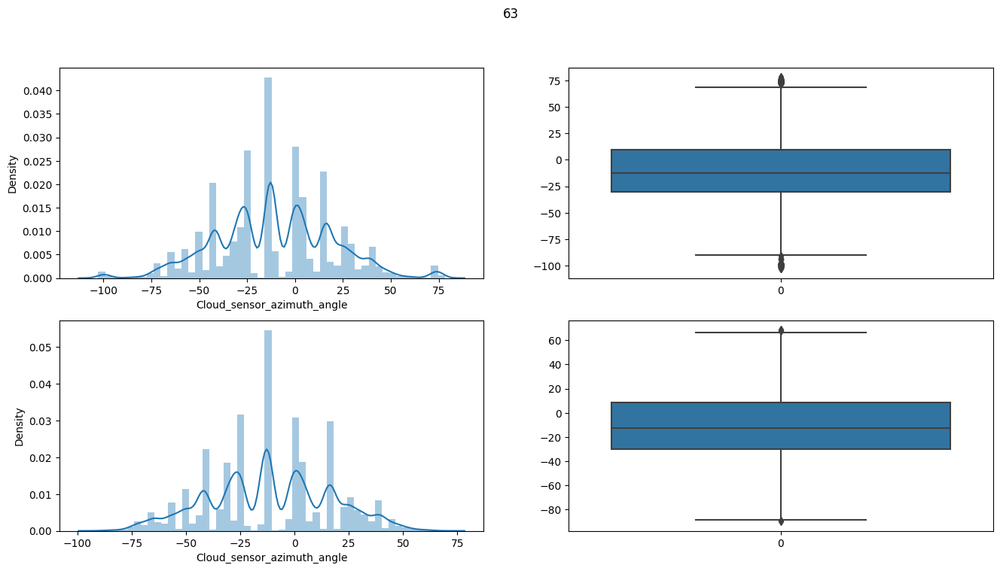

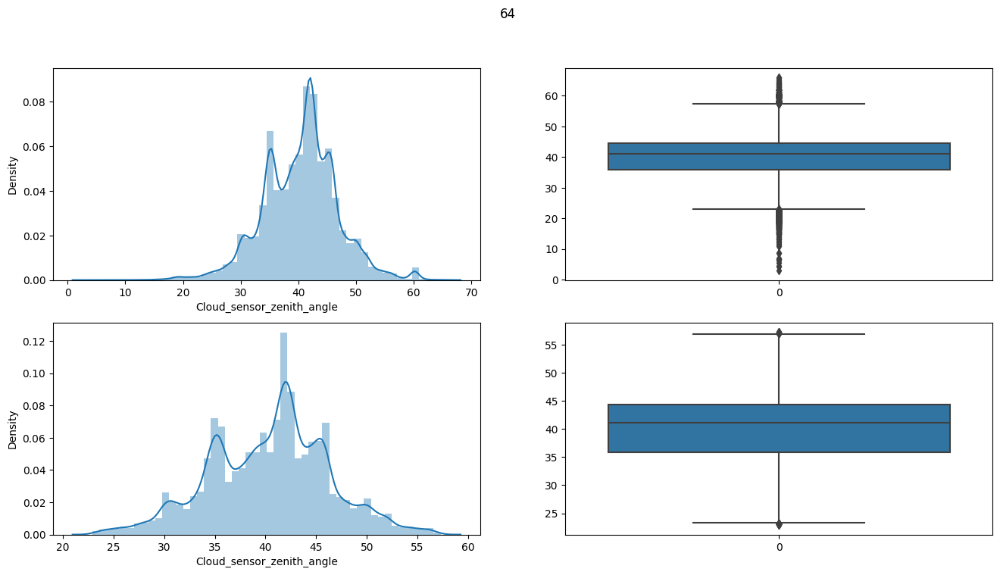

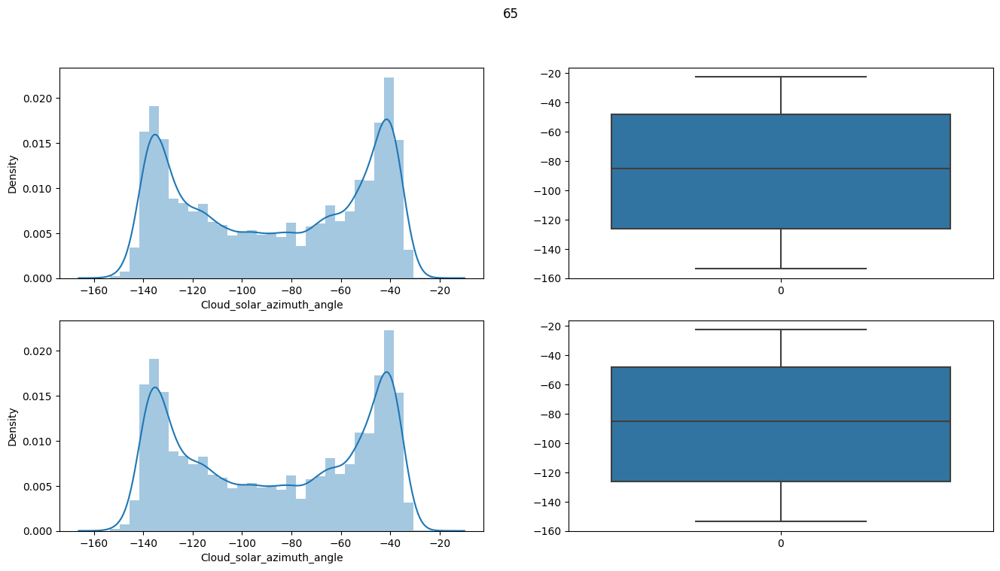

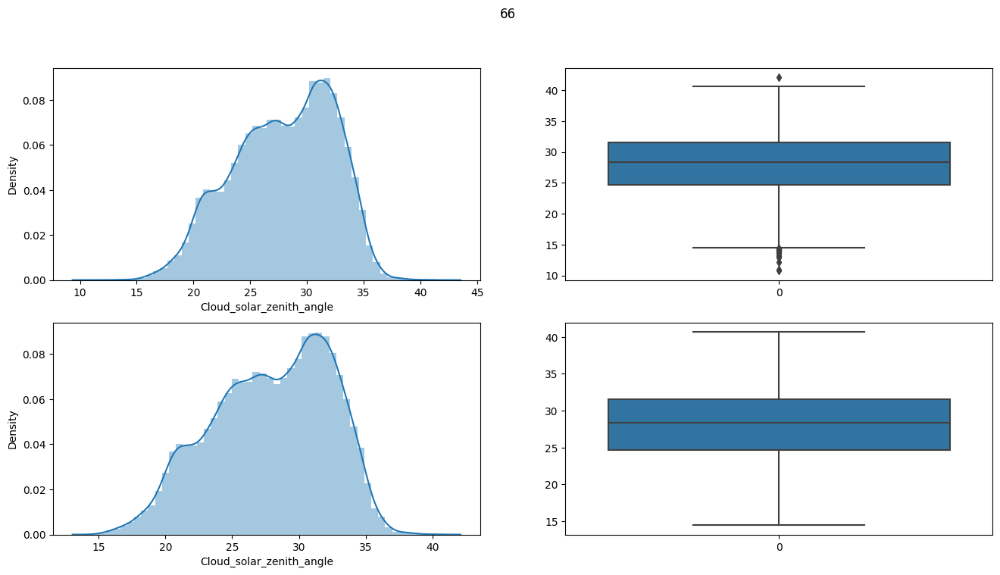

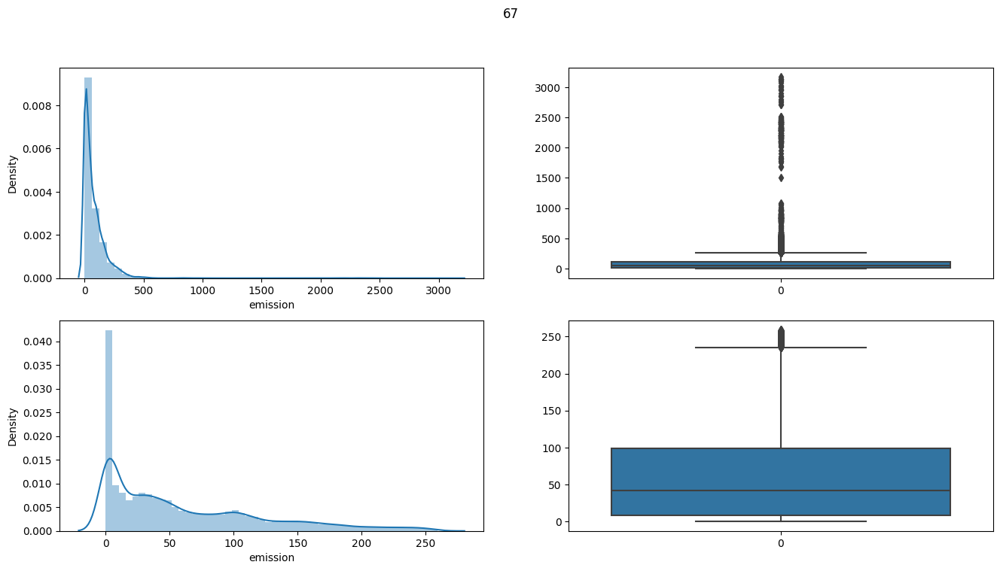

In [22]:
for i in num_col:
    find_outliers(i)

In [23]:
# Do Time series analysis using Plotly
## Make year and week categorical columns and do hot encoding

In [24]:
trainData['year'].unique()

array([2019, 2020, 2021], dtype=int64)

In [25]:
def week_count(year):
    df = trainData[trainData['year']==year]

    return df['week_no'].unique()

In [26]:
def get_first_day_of_week(year, week_number):
    first_monday = datetime.datetime(year,1,1)
    while first_monday.weekday()!=0:
        first_monday += timedelta(days=1)
    start_of_week = first_monday + timedelta(weeks=week_number)
    return start_of_week

In [27]:
trainData['Date'] = trainData.apply(lambda x: get_first_day_of_week(x['year'],x['week_no']),axis=1)

In [28]:
trainData.sort_values(by='Date',ascending=True,inplace=True)

In [29]:
fig = px.scatter_mapbox(trainData, lat='latitude', lon='longitude',
                        color='emission',
                        size='emission',
                        animation_frame='Date',
                        mapbox_style='open-street-map',
                        zoom=6,
                        title='CO2 emission over the 3 year period',
                        size_max=20)
fig.show()

In [30]:
groupedData = trainData.groupby(['week_no','year'])['emission'].sum().reset_index()
averageLine = groupedData.groupby('year')['emission'].mean().reset_index()
averageLine[averageLine['year']==2019].iloc[:,1][0]

31457.78902278764

In [31]:
groupedData = trainData.groupby(['week_no','year'])['emission'].sum().reset_index()
averageLine = groupedData.groupby('year')['emission'].mean().reset_index()
fig = px.line(groupedData,x='week_no',y='emission',color='year')
colors = {
    2019: 'blue',
    2020: 'red',
    2021: 'green'
}

for year, color in colors.items():
    avg_value = averageLine[averageLine['year'] == year]['emission'].values[0]
    fig.add_shape(
        type='line',
        x0=groupedData['week_no'].min(),
        x1=groupedData['week_no'].max(),
        y0=avg_value,
        y1=avg_value,
        line=dict(dash='dash', color=color),
        name=f'{year} Average'
    )
    fig.add_annotation(
        x=groupedData['week_no'].max(),
        y=avg_value,
        text=f'{year}:{np.ceil(avg_value)}'
    )
fig.show()

In [32]:
groupedData = trainData.groupby(['Date'])['emission'].sum().reset_index()
averageLine = groupedData['emission'].mean()
print(averageLine)

29917.885179564226


In [33]:
groupedData = trainData.groupby(['Date'])['emission'].sum().reset_index()
averageLine = groupedData['emission'].mean()
fig = px.line(groupedData,x='Date',y='emission')
fig.add_shape(
                type='line',
                x0=groupedData['Date'].min(),
                x1=groupedData['Date'].max(),
                y0=averageLine,
                y1=averageLine,
                line=dict(dash='dash'),
                name='average'
            )
fig.show()

d:\Python\Emission Rwanda\CO2-Emission\.venv\Lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [34]:
""" 
We see the pattern in data is pretty much repetitve, It peaks during April,October & around late december 
and June being one of the least CO2 emitting month.

1) Over three years emission has been averaged at 30K, but if we go year by year average 2019 has the highest average 31K
    then 2021 29.8K and last 2020: 27.2K
"""

' \nWe see the pattern in data is pretty much repetitve, It peaks during April,October & around late december \nand June being one of the least CO2 emitting month.\n\n1) Over three years emission has been averaged at 30K, but if we go year by year average 2019 has the highest average 31K\n    then 2021 29.8K and last 2020: 27.2K\n'

In [36]:
coords = trainData[['latitude','longitude']]
db = DBSCAN(eps=0.01, min_samples=50).fit(coords)
labels = db.labels_

In [37]:
mockTrain = trainData.copy()
mockTrain['cluster'] = labels
mockTrain[['latitude','longitude','cluster']].sort_values('cluster')

,latitude,longitude,cluster
5406,-0.905,29.495,0
5429,-0.905,29.495,0
5413,-0.905,29.495,0
5430,-0.905,29.495,0
5533,-0.905,29.495,0
...,...,...,...
69699,-2.821,29.479,477
69790,-2.821,29.479,477
69713,-2.821,29.479,477
69697,-2.821,29.479,477


In [38]:
mockTrain[mockTrain['cluster']==4]

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,Date,cluster
21624,ID_-1.346_31.254_2019_00,-1.346,31.254,2019,0,0.000045,0.935999,0.000044,0.134806,-43.166041,...,3912.069719,23.424895,0.267129,-31.109568,40.483852,-139.294995,30.084881,455.03890,2019-01-07,4
21625,ID_-1.346_31.254_2019_01,-1.346,31.254,2019,1,0.000196,0.838532,0.000161,0.055770,16.121207,...,2229.532380,25.019914,0.252964,-13.238261,35.351378,-139.294331,28.583703,503.49920,2019-01-14,4
21627,ID_-1.346_31.254_2019_03,-1.346,31.254,2019,3,0.000052,0.781977,0.000036,0.111512,-12.293900,...,5599.111532,23.493367,0.274978,-71.544079,36.357767,-132.384392,28.544638,548.22970,2019-01-28,4
21628,ID_-1.346_31.254_2019_04,-1.346,31.254,2019,4,-0.000053,0.726174,-0.000042,0.109236,16.578206,...,1725.762080,6.246211,0.256063,31.071510,28.454495,-135.780810,23.717625,569.67860,2019-02-04,4
21629,ID_-1.346_31.254_2019_05,-1.346,31.254,2019,5,0.000190,0.751305,0.000132,0.131287,-100.658709,...,5997.067388,36.150064,0.237790,3.165637,38.584632,-136.225008,21.100206,546.62310,2019-02-11,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21778,ID_-1.346_31.254_2021_48,-1.346,31.254,2021,48,0.000205,1.083852,0.000222,0.016030,72.964394,...,5106.785738,21.429520,0.286825,-13.029904,42.553445,-132.752584,32.280960,553.23300,2021-12-06,4
21779,ID_-1.346_31.254_2021_49,-1.346,31.254,2021,49,0.000232,1.080565,0.000261,0.170921,76.350074,...,5359.362860,16.968429,0.217844,4.473085,39.604489,-136.052704,31.408105,547.03937,2021-12-13,4
21780,ID_-1.346_31.254_2021_50,-1.346,31.254,2021,50,0.000136,0.838748,0.000117,0.119037,76.900532,...,4685.602357,39.238662,0.198917,-25.054336,32.543418,-134.956150,32.809425,547.37744,2021-12-20,4
21781,ID_-1.346_31.254_2021_51,-1.346,31.254,2021,51,NaN,NaN,NaN,NaN,NaN,...,8618.739495,26.319979,0.256808,15.904751,41.686568,-140.677902,30.005124,511.91860,2021-12-27,4


In [40]:
mockTrain['cluster'].nunique()

478

In [41]:
mockTrainCluster = pd.merge(mockTrain,mockTrain.groupby('cluster').agg(avg_latitude = ('latitude','mean'),
                                           avg_longitude = ('longitude','mean')).reset_index(),how='left',on='cluster')

In [46]:
mockTrainCluster.iloc[:4,]

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,Date,cluster,avg_latitude,avg_longitude
0,ID_-0.905_29.495_2019_00,-0.905,29.495,2019,0,0.000132,0.998244,0.000132,0.118839,72.937202,...,0.276220,74.669003,32.471788,-144.477463,27.382769,2.837571,2019-01-07,0,-0.905,29.495
1,ID_-1.176_30.624_2019_00,-1.176,30.624,2019,0,NaN,NaN,NaN,NaN,NaN,...,0.286768,-13.203910,50.242857,-140.814959,30.237186,50.169685,2019-01-07,1,-1.176,30.624
2,ID_-2.841_29.159_2019_00,-2.841,29.159,2019,0,-0.000236,0.769738,-0.000156,0.083730,-100.009846,...,0.325721,-12.694486,35.557305,-136.393341,29.485029,0.000000,2019-01-07,2,-2.841,29.159
3,ID_-2.770_28.930_2019_00,-2.770,28.930,2019,0,-0.000222,0.841070,-0.000178,0.142169,-99.416097,...,0.325694,-13.091717,51.741989,-138.115570,29.286560,40.262936,2019-01-07,3,-2.770,28.930


In [223]:
print(mockTrainCluster.iloc[:,1:].corr()['emission'].sort_values(ascending=False).iloc[2],mockTrainCluster.iloc[:,1:].corr()['emission'].sort_values(ascending=False).iloc[-1])


0.09444646881934467 -0.04228527978902405


In [110]:
matrix = mockTrainCluster.iloc[:,1:].corr()['emission']
matrix = pd.DataFrame(matrix).T

In [111]:
matrix

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,...,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,Date,cluster,avg_latitude,avg_longitude
emission,0.014989,0.094467,-0.012124,0.005591,-0.017328,-0.001517,-0.020168,0.002297,-0.022149,-0.006232,...,0.04541,0.006956,-0.016666,-0.025888,-0.022229,1.0,-0.009497,0.048137,0.014965,0.094446


In [104]:
pd.DataFrame(matrix.iloc[-5,:10]).T

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle
emission,0.014989,0.094467,-0.012124,0.005591,-0.017328,-0.001517,-0.020168,0.002297,-0.022149,-0.006232


In [107]:
pd.concat([pd.concat([matrix.iloc[:10,:10],matrix.iloc[:10,-5]],axis=1),pd.DataFrame(matrix.iloc[-5,:10]).T],axis=0).fillna(1)

,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,SulphurDioxide_sensor_zenith_angle,emission
latitude,1.000000,0.241630,0.002248,0.000049,0.001303,0.042825,0.004420,-0.004789,-0.007725,-0.017348,0.014989
longitude,0.241630,1.000000,0.004344,0.001134,-0.127434,0.087412,-0.128575,0.031772,-0.014366,0.012794,0.094467
year,0.002248,0.004344,1.000000,0.003332,0.004344,-0.128109,0.002422,-0.021610,0.056552,-0.018665,-0.012124
week_no,0.000049,0.001134,0.003332,1.000000,0.006714,0.067431,0.015620,-0.000308,0.027909,-0.094339,0.005591
SulphurDioxide_SO2_column_number_density,0.001303,-0.127434,0.004344,0.006714,1.000000,-0.068550,0.967128,-0.014428,0.016345,0.005092,-0.017328
SulphurDioxide_SO2_column_number_density_amf,0.042825,0.087412,-0.128109,0.067431,-0.068550,1.000000,-0.040781,0.255526,-0.111440,-0.073694,-0.001517
SulphurDioxide_SO2_slant_column_number_density,0.004420,-0.128575,0.002422,0.015620,0.967128,-0.040781,1.000000,-0.012710,0.018638,0.003029,-0.020168
SulphurDioxide_cloud_fraction,-0.004789,0.031772,-0.021610,-0.000308,-0.014428,0.255526,-0.012710,1.000000,-0.103277,0.220311,0.002297
SulphurDioxide_sensor_azimuth_angle,-0.007725,-0.014366,0.056552,0.027909,0.016345,-0.111440,0.018638,-0.103277,1.000000,0.048610,-0.022149
SulphurDioxide_sensor_zenith_angle,-0.017348,0.012794,-0.018665,-0.094339,0.005092,-0.073694,0.003029,0.220311,0.048610,1.000000,-0.006232


In [109]:
px.imshow(pd.concat([pd.concat([matrix.iloc[:4,:4],matrix.iloc[:4,-5]],axis=1),pd.DataFrame(matrix.iloc[-5,:4]).T],axis=0).fillna(1))

In [115]:
mockTrain.columns

Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no',
       'SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_column_number_density_amf',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_solar_zenith_angle',
       'SulphurDioxide_SO2_column_number_density_15km',
       'CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
       'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_sensor_zenith_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle',
       'NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_tropospheric_NO2_column_number_density',
       'NitrogenDioxide

In [114]:
"""
Correlation against emission
1) Location
2) Date/time
3) SO2
4) CO
5) No2
6) HCHO
7) Uv
8) O3
9) Cloud
"""

'\nCorrelation against emission\n1) Location\n2) Date/time\n3) SO2\n4) CO\n5) No2\n6) HCHO\n7) Uv\n8) O3\n9) Cloud\n'

In [182]:
locationColumns = ['latitude','longitude','cluster']
dateColumns = ['year','week_no','Date']
so2Columns = mockTrain.iloc[:,5:14].columns.tolist()
coColumns = mockTrain.iloc[:,14:22].columns.tolist()
no2Columns = mockTrain.iloc[:,22:34].columns.tolist()
hchoColumns = mockTrain.iloc[:,34:42].columns.tolist()
uvColumns = mockTrain.iloc[:,42:48].columns.tolist()
o3Columns = mockTrain.iloc[:,48:57].columns.tolist()
cloudColumns = mockTrain.iloc[:,57:68].columns.tolist()

In [227]:
def corrMatrxi(columnNames):
    fig = px.imshow(matrix[columnNames],zmax=0.1,zmin=-.05,color_continuous_scale='viridis')
    fig.show()

In [228]:
columnList = [locationColumns,dateColumns,so2Columns,coColumns,no2Columns,hchoColumns,uvColumns,
              o3Columns,cloudColumns]
for i in columnList:
    corrMatrxi(i)

In [229]:
"""
List of Top positive 10 and Bottom negative 10 
"""

'\nList of Top positive 10 and Bottom negative 10 \n'

In [233]:
mockTrainCluster.iloc[:,1:].corr()['emission'].sort_values(ascending=False)[1:10]

longitude                                                   0.094467
avg_longitude                                               0.094446
cluster                                                     0.048137
Cloud_surface_albedo                                        0.045410
Formaldehyde_tropospheric_HCHO_column_number_density_amf    0.039630
NitrogenDioxide_sensor_altitude                             0.028073
NitrogenDioxide_cloud_fraction                              0.021745
NitrogenDioxide_absorbing_aerosol_index                     0.018897
latitude                                                    0.014989
Name: emission, dtype: float64

In [232]:
mockTrainCluster.iloc[:,1:].corr()['emission'].sort_values(ascending=False)[-10:]

Cloud_solar_azimuth_angle                              -0.025888
Ozone_solar_azimuth_angle                              -0.026516
UvAerosolIndex_solar_azimuth_angle                     -0.026521
CarbonMonoxide_solar_azimuth_angle                     -0.028241
Formaldehyde_solar_azimuth_angle                       -0.032290
SulphurDioxide_solar_azimuth_angle                     -0.033601
Formaldehyde_tropospheric_HCHO_column_number_density   -0.034268
NitrogenDioxide_solar_azimuth_angle                    -0.034664
CarbonMonoxide_CO_column_number_density                -0.037328
CarbonMonoxide_H2O_column_number_density               -0.042285
Name: emission, dtype: float64

In [243]:
mockTrain[['latitude','longitude']].head(2)

,latitude,longitude
5406,-0.905,29.495
15105,-1.176,30.624


In [268]:
import geopandas as gpd
from shapely.geometry import Point

# Path to the unzipped shapefile
shapefile_path = 'D:/Kaggle Datasets/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp'

# Load the shapefile
world = gpd.read_file(shapefile_path)

# Define the geometry for Rwanda
rwanda = world[world.ADMIN == 'Rwanda'].geometry.iloc[0]

def point_in_rwanda(lat, lon):
    point = Point(lon, lat)
    return point.within(rwanda)


# Test with a sample point
latitude, longitude = -1.868, 29.832
result = point_in_rwanda(latitude, longitude)
print(result)

True


In [292]:
import geopandas as gpd
from shapely.geometry import Point

# Path to the unzipped shapefile
shapefile_path = 'D:/Kaggle Datasets/ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp'

# Load the shapefile
world = gpd.read_file(shapefile_path)

# Define the geometry for Rwanda
rwanda = world[world.ADMIN == 'Rwanda'].geometry.iloc[0]

def point_in_africa(lat, lon):
    point = Point(lon, lat)
    for idx, row in world.iterrows():
        if point.within(row['geometry']):
            return row['ADMIN']
        
    return "Unknown"

Democratic Republic of the Congo


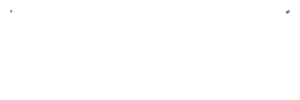

In [283]:
world.geometry.iloc[0]

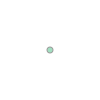

In [280]:
Point(180.00000, -16.06713)

In [276]:
world[['ADMIN','geometry']]

,ADMIN,geometry
0,Fiji,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,United Republic of Tanzania,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,Western Sahara,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,Canada,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,United States of America,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...
172,Republic of Serbia,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,Montenegro,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,Kosovo,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,Trinidad and Tobago,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


In [271]:
mockTrain['is_Rwanda'] = mockTrain.apply(lambda x: point_in_rwanda(x['latitude'],x['longitude']),axis=1)

In [293]:
mockTrain['country'] = mockTrain.apply(lambda x: point_in_africa(x['latitude'],x['longitude']),axis=1)

In [294]:
mockTrain['country'].unique()

array(['Democratic Republic of the Congo', 'United Republic of Tanzania',
       'Rwanda', 'Uganda', 'Burundi'], dtype=object)

In [300]:
mockTrain.iloc[:,0]

5406     ID_-0.905_29.495_2019_00
15105    ID_-1.176_30.624_2019_00
70755    ID_-2.841_29.159_2019_00
67734    ID_-2.770_28.930_2019_00
21624    ID_-1.346_31.254_2019_00
                   ...           
8903     ID_-1.000_29.800_2021_52
46268    ID_-2.065_30.235_2021_52
14786    ID_-1.170_29.330_2021_52
67574    ID_-2.764_29.136_2021_52
4292     ID_-0.837_29.863_2021_52
Name: ID_LAT_LON_YEAR_WEEK, Length: 56896, dtype: object

In [306]:
countryCount = mockTrain.groupby('country')['ID_LAT_LON_YEAR_WEEK'].count().reset_index()

In [323]:
countryCount['ID_LAT_LON_YEAR_WEEK'].sum()

56896

In [335]:
fig = px.bar(
    countryCount,
    x=countryCount['country'],
    y=countryCount['ID_LAT_LON_YEAR_WEEK']   
    )
total = countryCount['ID_LAT_LON_YEAR_WEEK'].sum()
for ind,row in countryCount.iterrows():
    fig.add_annotation(
        x = row['country'],
        y=(row['ID_LAT_LON_YEAR_WEEK']),
        text=f"{round(row['ID_LAT_LON_YEAR_WEEK']/total,3)}"
    )
fig.show()

In [274]:
mockTrain[mockTrain['is_Rwanda']==False]

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission,Date,cluster,is_Rwanda
5406,ID_-0.905_29.495_2019_00,-0.905,29.495,2019,0,0.000132,0.998244,0.000132,0.118839,72.937202,...,23.994306,0.276220,74.669003,32.471788,-144.477463,27.382769,2.837571,2019-01-07,0,False
15105,ID_-1.176_30.624_2019_00,-1.176,30.624,2019,0,NaN,NaN,NaN,NaN,NaN,...,14.014644,0.286768,-13.203910,50.242857,-140.814959,30.237186,50.169685,2019-01-07,1,False
67734,ID_-2.770_28.930_2019_00,-2.770,28.930,2019,0,-0.000222,0.841070,-0.000178,0.142169,-99.416097,...,21.186062,0.325694,-13.091717,51.741989,-138.115570,29.286560,40.262936,2019-01-07,3,False
21624,ID_-1.346_31.254_2019_00,-1.346,31.254,2019,0,0.000045,0.935999,0.000044,0.134806,-43.166041,...,23.424895,0.267129,-31.109568,40.483852,-139.294995,30.084881,455.038900,2019-01-07,4,False
2862,ID_-0.785_29.115_2019_00,-0.785,29.115,2019,0,-0.000091,0.557227,-0.000050,0.182611,-98.563187,...,10.712703,0.261230,16.877681,39.300272,-139.993830,30.349690,31.326656,2019-01-07,6,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70754,ID_-2.841_28.659_2021_52,-2.841,28.659,2021,52,NaN,NaN,NaN,NaN,NaN,...,31.148756,0.277898,-13.026250,42.548001,-137.726169,29.959254,45.185380,2022-01-03,146,False
68210,ID_-2.772_30.928_2021_52,-2.772,30.928,2021,52,NaN,NaN,NaN,NaN,NaN,...,45.109177,0.256897,0.094319,41.936414,-136.083328,30.300669,35.210080,2022-01-03,400,False
8903,ID_-1.000_29.800_2021_52,-1.000,29.800,2021,52,NaN,NaN,NaN,NaN,NaN,...,35.736135,0.328829,-12.301293,42.395641,-138.133688,32.232281,39.477260,2022-01-03,264,False
14786,ID_-1.170_29.330_2021_52,-1.170,29.330,2021,52,0.000071,0.780233,0.000055,0.273866,-12.517071,...,12.405237,0.320435,-12.666138,42.677815,-138.613898,31.450914,0.658007,2022-01-03,61,False
